In [1]:
!pip install -q numpy
!pip install -q tensorflow
!pip install opencv-python
!pip install -q scikit-image
!pip install -q matplotlib

In [2]:
import os
import glob
import cv2
import numpy as np
import tensorflow as tf
from zipfile import ZipFile
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Add, Concatenate, Multiply
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from skimage.color import rgb2lab, lab2rgb
from skimage.metrics import peak_signal_noise_ratio
import matplotlib.pyplot as plt

In [3]:
import os

ds_path = "dataset/landscape-pictures"
os.makedirs(ds_path, exist_ok=True)

In [4]:
# Dataset download & paths
DS_PATH = './dataset/landscape-pictures'
COLOR_PATH = os.path.join(DS_PATH, 'color')
TARGET_SIZE = (224, 224)  # (width, height)
BATCH_SIZE = 8
MAX_SAMPLES = 2500
AB_SCALE = 0.5

In [5]:
# Download and extract dataset
!curl -L https://www.kaggle.com/api/v1/datasets/download/arnaud58/landscape-pictures -o ./dataset/landscape-pictures.zip

import zipfile
with zipfile.ZipFile('dataset/landscape-pictures.zip', 'r') as zip_ref:
    zip_ref.extractall(ds_path)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  620M  100  620M    0     0  92.5M      0  0:00:06  0:00:06 --:--:-- 80.5M


In [6]:
os.makedirs(COLOR_PATH, exist_ok=True)

# Move images to color directory
original_files = sorted(glob.glob(os.path.join(DS_PATH, '*.jpg')))
for f in original_files:
    color_file = os.path.join(COLOR_PATH, os.path.basename(f))
    if not os.path.exists(color_file):
        os.rename(f, color_file)

In [7]:
color_files = sorted(glob.glob(os.path.join(COLOR_PATH, '*.jpg')))
if MAX_SAMPLES is not None:
    color_files = color_files[:MAX_SAMPLES]

In [8]:
import numpy as np

np.random.seed(42)
np.random.shuffle(color_files)

total_samples = len(color_files)
train_size = int(0.7 * total_samples)
val_size = int(0.15 * total_samples)

train_files = color_files[:train_size]
val_files = color_files[train_size : train_size + val_size]
test_files = color_files[train_size + val_size:]

print(f"Train samples: {len(train_files)}")
print(f"Validation samples: {len(val_files)}")
print(f"Test samples: {len(test_files)}")

Train samples: 1750
Validation samples: 375
Test samples: 375


In [9]:
def image_generator(file_list):
    # Generates (L, ab) pairs for UNet training.
    for color_file in file_list:
        # Read color image
        color_img = cv2.imread(color_file, cv2.IMREAD_COLOR)
        if color_img is None:
            continue

        # Resize
        color_img = cv2.resize(color_img, TARGET_SIZE)
        color_img = color_img[:, :, ::-1]  # BGR -> RGB

        # Convert to LAB
        lab_img = rgb2lab(color_img / 255.0)

        # Normalize
        L = lab_img[:, :, 0:1] / 100.0
        ab = lab_img[:, :, 1:] / 128.0 * AB_SCALE

        yield L.astype(np.float32), ab.astype(np.float32)

In [10]:
def create_dataset(file_list):
    dataset = tf.data.Dataset.from_generator(
        lambda: image_generator(file_list),
        output_signature=(
            tf.TensorSpec(shape=(TARGET_SIZE[1], TARGET_SIZE[0], 1), dtype=tf.float32),
            tf.TensorSpec(shape=(TARGET_SIZE[1], TARGET_SIZE[0], 2), dtype=tf.float32)
        )
    )
    dataset = dataset.shuffle(buffer_size=len(file_list))
    dataset = dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return dataset

train_dataset = create_dataset(train_files)
val_dataset = create_dataset(val_files)
test_dataset = create_dataset(test_files)

In [11]:
for L_batch, ab_batch in train_dataset.take(1):
  print(f"L batch shape: {L_batch.shape}, ab batch shape: {ab_batch.shape}")
  print(f"L range: [{L_batch.numpy().min()}, {L_batch.numpy().max()}]")
  print(f"ab range: [{ab_batch.numpy().min()}, {ab_batch.numpy().max()}]")

L batch shape: (8, 224, 224, 1), ab batch shape: (8, 224, 224, 2)
L range: [0.0, 1.0]
ab range: [-0.2629457414150238, 0.3242187798023224]


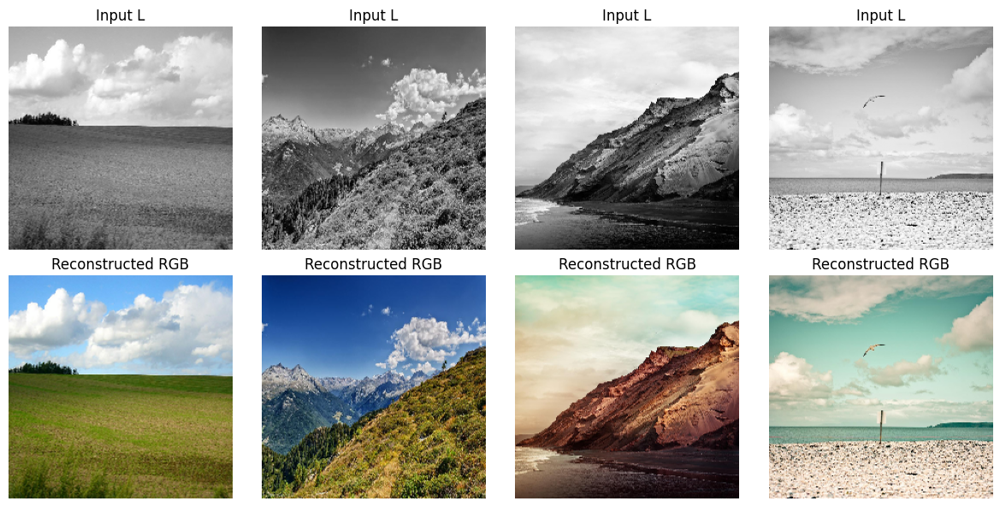

In [12]:
import matplotlib.pyplot as plt
from skimage.color import lab2rgb

def visualize_batch(dataset, num_samples=4):
    """
    Visualizes a batch of L + ab images from the dataset.

    Args:
        dataset: TF dataset yielding (L, ab)
        num_samples: Number of images to visualize from the first batch
    """
    # Get first batch
    for L_batch, ab_batch in dataset.take(1):
        L_batch = L_batch.numpy()
        ab_batch = ab_batch.numpy()
        break

    # Limit number of samples
    num_samples = min(num_samples, L_batch.shape[0])

    plt.figure(figsize=(12, 6))
    for i in range(num_samples):
        L = L_batch[i]  # (H,W,1)
        ab = ab_batch[i]  # (H,W,2)

        # Reconstruct RGB
        lab_img = np.zeros((L.shape[0], L.shape[1], 3))
        lab_img[:, :, 0] = L[:, :, 0] * 100.0          # Denormalize L
        lab_img[:, :, 1:] = ab / AB_SCALE * 128.0      # Denormalize ab

        rgb_img = lab2rgb(lab_img)  # LAB -> RGB

        # Plot
        plt.subplot(2, num_samples, i + 1)
        plt.imshow(L[:, :, 0], cmap='gray')
        plt.title("Input L")
        plt.axis('off')

        plt.subplot(2, num_samples, i + 1 + num_samples)
        plt.imshow(rgb_img)
        plt.title("Reconstructed RGB")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# usage
visualize_batch(train_dataset, num_samples=4)

In [13]:
import tensorflow as tf
from tensorflow.keras import layers, Model

def conv_block(input_tensor, num_filters):
    """Standard Conv Block: Conv2D + BatchNorm + LeakyReLU"""
    x = layers.Conv2D(num_filters, 3, padding='same')(input_tensor)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.01)(x)

    x = layers.Conv2D(num_filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.01)(x)
    return x

def attention_block(x, g, inter_channels):
    """
    Spatial attention block for UNet
    x: encoder feature map
    g: decoder feature map
    """
    theta_x = layers.Conv2D(inter_channels, 1, padding='same')(x)
    phi_g = layers.Conv2D(inter_channels, 1, padding='same')(g)
    add = layers.Add()([theta_x, phi_g])
    act = layers.ReLU()(add)
    psi = layers.Conv2D(1, 1, padding='same')(act)
    psi = layers.Activation('sigmoid')(psi)
    return layers.Multiply()([x, psi])

def build_unet(input_shape=(128,128,1)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    enc1 = conv_block(inputs, 64)
    pool1 = layers.MaxPooling2D(2)(enc1)

    enc2 = conv_block(pool1, 128)
    pool2 = layers.MaxPooling2D(2)(enc2)

    enc3 = conv_block(pool2, 256)
    pool3 = layers.MaxPooling2D(2)(enc3)

    # Bottleneck with dropout
    bottleneck = conv_block(pool3, 512)
    bottleneck = layers.Dropout(0.5)(bottleneck)

    # Decoder with attention
    up1 = layers.Conv2DTranspose(256, 2, strides=2, padding='same')(bottleneck)
    att1 = attention_block(enc3, up1, 128)
    dec1 = layers.Concatenate()([up1, att1])
    dec1 = conv_block(dec1, 256)

    up2 = layers.Conv2DTranspose(128, 2, strides=2, padding='same')(dec1)
    att2 = attention_block(enc2, up2, 64)
    dec2 = layers.Concatenate()([up2, att2])
    dec2 = conv_block(dec2, 128)

    up3 = layers.Conv2DTranspose(64, 2, strides=2, padding='same')(dec2)
    att3 = attention_block(enc1, up3, 32)
    dec3 = layers.Concatenate()([up3, att3])
    dec3 = conv_block(dec3, 64)

    # Output layer: 2 channels for ab
    outputs = layers.Conv2D(2, 1, activation=None)(dec3)

    model = Model(inputs, outputs)
    return model

# Build model
model = build_unet(input_shape=(224, 224, 1))
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 224, 224,  │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 224, 224,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 224, 224,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 224, 224,  │     36,928 │ leaky_re_lu[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 224, 224,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 224, 224,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 112, 112,  │          0 │ leaky_re_lu_1[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 112, 112,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 112, 112,  │    147,584 │ leaky_re_lu_2[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 56, 56,    │          0 │ leaky_re_lu_3[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 56, 56,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │      1,024 │ conv2d_4[0][0]  

 Total params: 7,794,213 (29.73 MB)

 Trainable params: 7,788,581 (29.71 MB)

 Non-trainable params: 5,632 (22.00 KB)

In [14]:
# Huber loss for sharper colorization
loss = tf.keras.losses.Huber()

# Adam optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4, clipnorm=1.0)

# Compile model
model.compile(optimizer=optimizer, loss=loss, metrics=['mae'])

In [15]:
from google.colab import drive
drive.mount('/content/drive')
MODEL_DIR = '/content/drive/MyDrive/unet_colorization/final_model'
os.makedirs(MODEL_DIR, exist_ok=True)
!mkdir -p {DRIVE_DIR}

Mounted at /content/drive


In [16]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

checkpoint_path = os.path.join(MODEL_DIR, 'unet_colorization_best_.keras')

callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=7,
        min_lr=1e-6,
        verbose=1
    ),
    ModelCheckpoint(
        checkpoint_path,
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

In [17]:
EPOCHS = 100

history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    initial_epoch = 0,
    callbacks=callbacks
)

Epoch 1/100
    219/Unknown 205s 550ms/step - loss: 0.0193 - mae: 0.0953

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 1: val_loss improved from inf to 0.00254, saving model to /content/drive/MyDrive/unet_colorization/final_model/unet_colorization_best_.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 231s 667ms/step - loss: 0.0192 - mae: 0.0952 - val_loss: 0.0025 - val_mae: 0.0487 - learning_rate: 5.0000e-04
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step - loss: 0.0022 - mae: 0.0456
Epoch 2: val_loss did not improve from 0.00254
219/219 ━━━━━━━━━━━━━━━━━━━━ 110s 399ms/step - loss: 0.0022 - mae: 0.0456 - val_loss: 0.0031 - val_mae: 0.0553 - learning_rate: 5.0000e-04
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step - loss: 0.0019 - mae: 0.0417
Epoch 3: val_loss improved from 0.00254 to 0.00181, saving model to /content/drive/MyDrive/unet_colorization/final_model/unet_colorization_best_.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 110s 399ms/step - loss: 0.0019 - mae: 0.0417 - val_loss: 0.0018 - val_mae: 0.0407 - learning_rate: 5.0000e-04
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step - loss: 0.0019

In [18]:
# Save locally first
LOCAL_MODEL_PATH = './unet_colorization_last_final.keras'
model.save(LOCAL_MODEL_PATH)
print(f"Local model saved at: {LOCAL_MODEL_PATH}")

# Copy to Drive using !cp
DRIVE_DIR = "drive/MyDrive/unet_colorization"
!cp -r {LOCAL_MODEL_PATH} {DRIVE_DIR}/
print(f"Model copied to Drive at: {DRIVE_DIR}/unet_colorization_last_final.keras")

Local model saved at: ./unet_colorization_last_final.keras
Model copied to Drive at: drive/MyDrive/unet_colorization/unet_colorization_last_final.keras


In [19]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import numpy as np

def evaluate_model(model, dataset, ab_scale=0.5):
    mae_list = []
    psnr_list = []
    ssim_list = []

    for L_batch, ab_batch in dataset:
        L_batch = L_batch.numpy()
        ab_batch = ab_batch.numpy()

        # Predict ab
        pred_ab_batch = model.predict(L_batch)

        # Compute MAE on ab channels
        mae_batch = np.mean(np.abs(pred_ab_batch - ab_batch))
        mae_list.append(mae_batch)

        # Compute PSNR and SSIM on reconstructed RGB
        for i in range(L_batch.shape[0]):
            L = L_batch[i]
            true_ab = ab_batch[i]
            pred_ab = pred_ab_batch[i]

            # Reconstruct RGB
            true_rgb = reconstruct_rgb(L, true_ab)
            pred_rgb = reconstruct_rgb(L, pred_ab)

            # PSNR
            psnr_val = psnr(true_rgb, pred_rgb, data_range=1.0)
            psnr_list.append(psnr_val)

            # SSIM with proper channel_axis
            ssim_val = ssim(
                true_rgb, pred_rgb,
                data_range=1.0,
                channel_axis=-1,
                win_size=7
            )
            ssim_list.append(ssim_val)

    mean_mae = np.mean(mae_list)
    mean_psnr = np.mean(psnr_list)
    mean_ssim = np.mean(ssim_list)

    print(f"Evaluation Metrics on Dataset:")
    print(f"MAE (ab channels): {mean_mae:.4f}")
    print(f"PSNR (RGB): {mean_psnr:.2f}")
    print(f"SSIM (RGB): {mean_ssim:.4f}")

    return mean_mae, mean_psnr, mean_ssim

In [49]:
import numpy as np
from skimage.color import lab2rgb
import matplotlib.pyplot as plt

AB_SCALE = 0.5

def reconstruct_rgb(L, ab):
    """
    L: (H, W, 1) normalized [0,1]
    ab: (H, W, 2) normalized [-AB_SCALE, AB_SCALE]
    """
    lab_img = np.zeros((L.shape[0], L.shape[1], 3))
    lab_img[:, :, 0] = L[:, :, 0] * 100.0
    lab_img[:, :, 1:] = ab / AB_SCALE * 128.0
    rgb = lab2rgb(lab_img)
    return np.clip(rgb, 0, 1)

def visualize_colorization(model, dataset, index=0, num_samples=10):
    # Convert dataset to list of samples
    all_L = []
    all_ab = []
    for L_batch, ab_batch in dataset:
        all_L.append(L_batch.numpy())
        all_ab.append(ab_batch.numpy())

    # Concatenate all batches
    L_all = np.concatenate(all_L, axis=0)
    ab_all = np.concatenate(all_ab, axis=0)

    # Validate index
    if index >= len(L_all):
        raise IndexError(f"Index {index} out of range (dataset has {len(L_all)} samples)")

    # Get the specific sample
    L = L_all[index]
    true_ab = ab_all[index]

    # Predict
    pred_ab = model.predict(L[np.newaxis, ...], verbose=0)[0]

    # Reconstruct
    pred_rgb = reconstruct_rgb(L, pred_ab)
    true_rgb = reconstruct_rgb(L, true_ab)

    # Plot
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(L[:, :, 0], cmap='gray')
    plt.title('Grayscale Input')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(pred_rgb)
    plt.title('Predicted Color')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(true_rgb)
    plt.title('Ground Truth')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

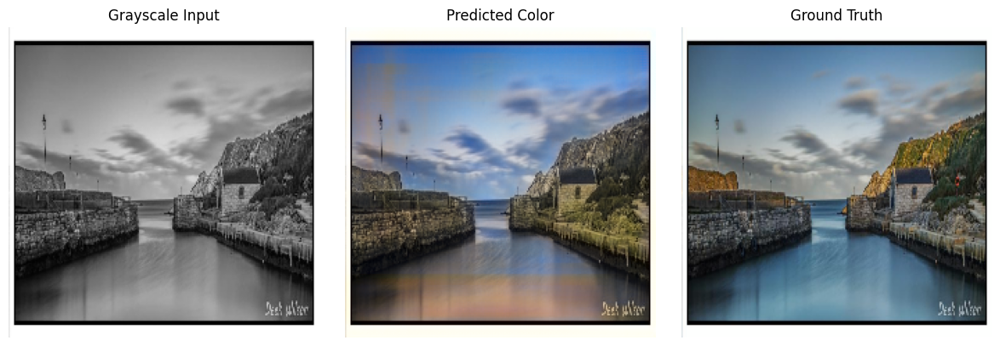

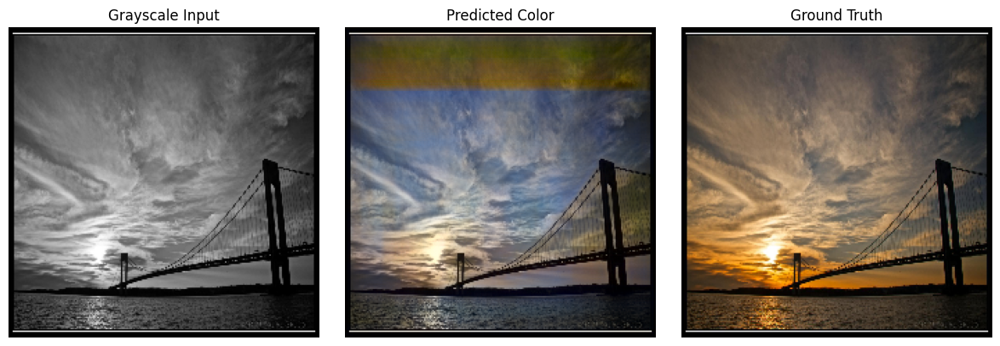

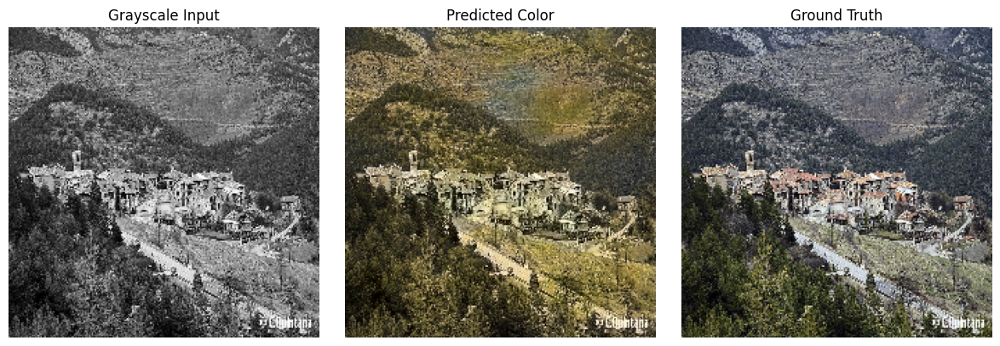

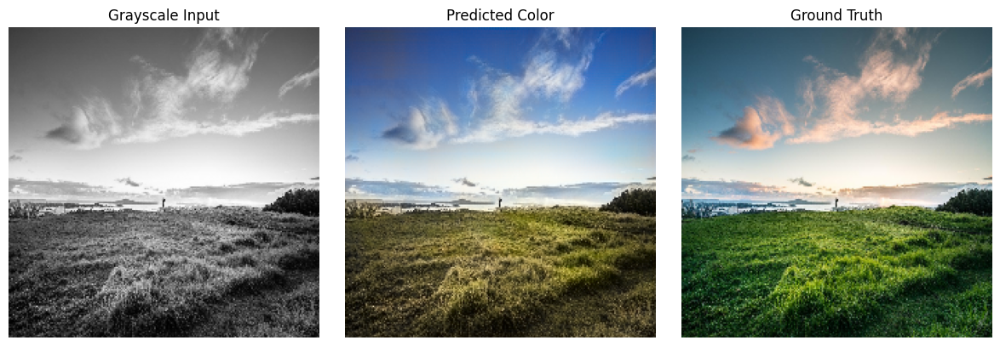

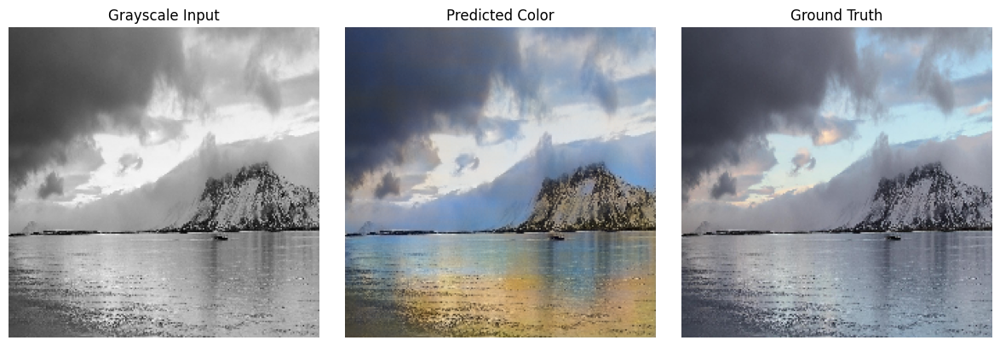

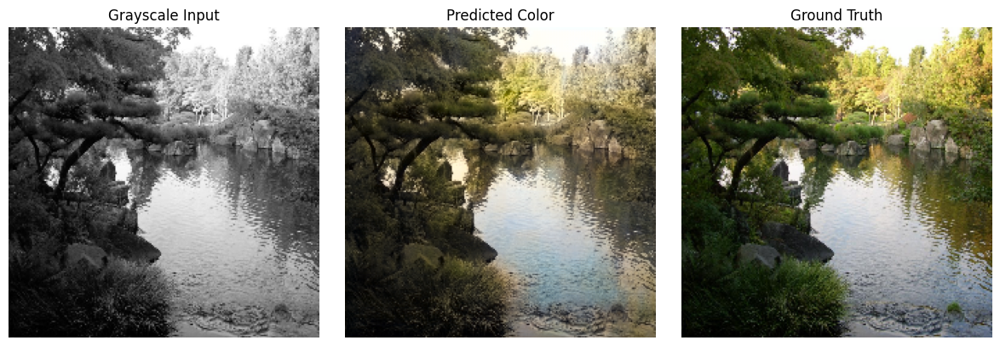

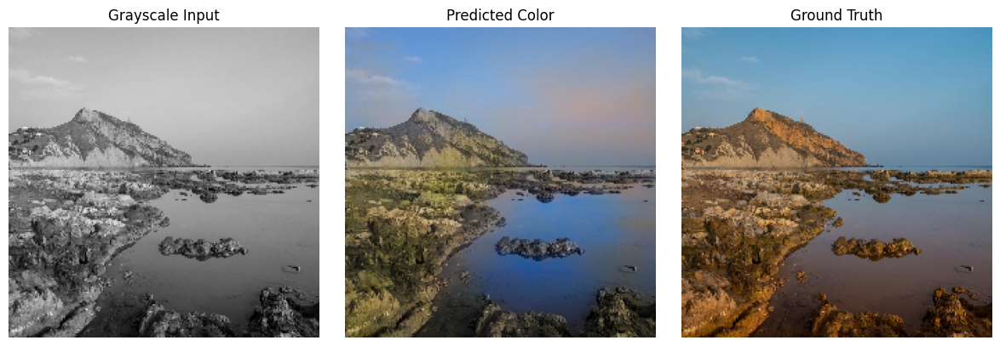

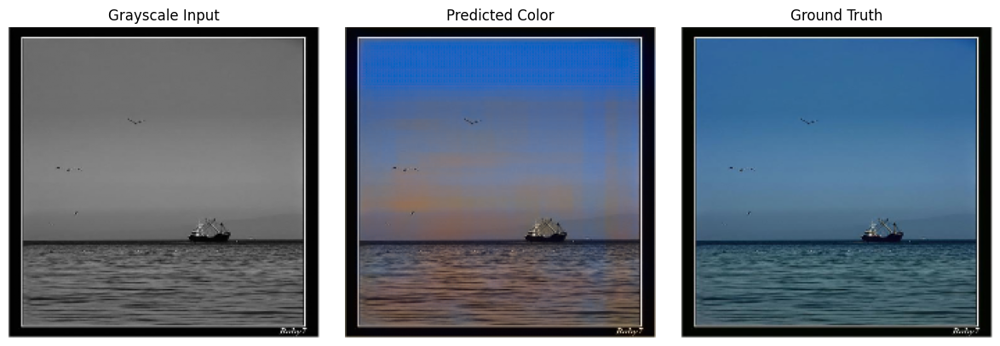

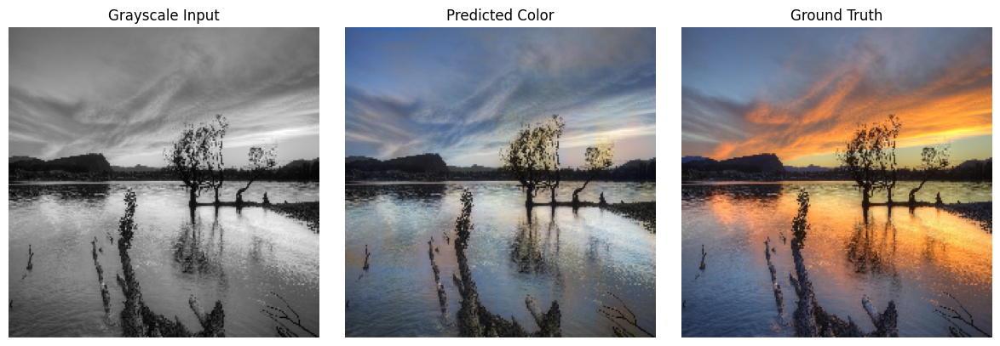

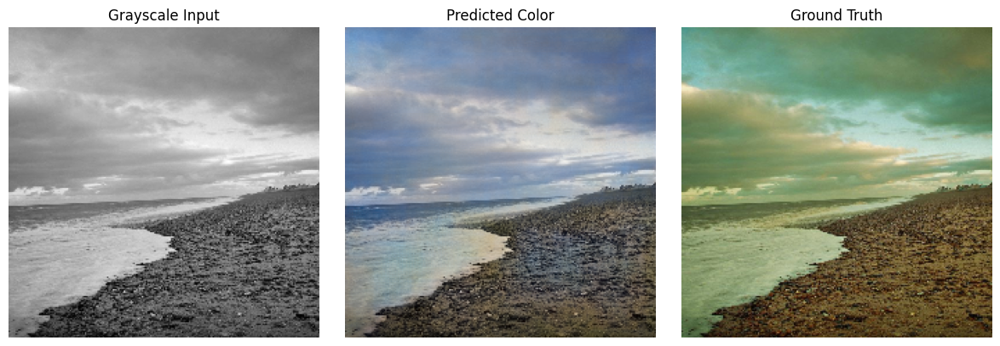

In [83]:
for i in range(10):
  visualize_colorization(model, val_dataset, i)

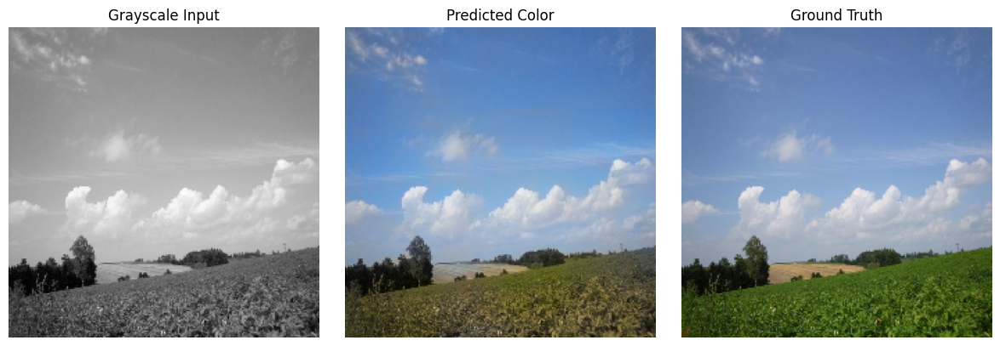

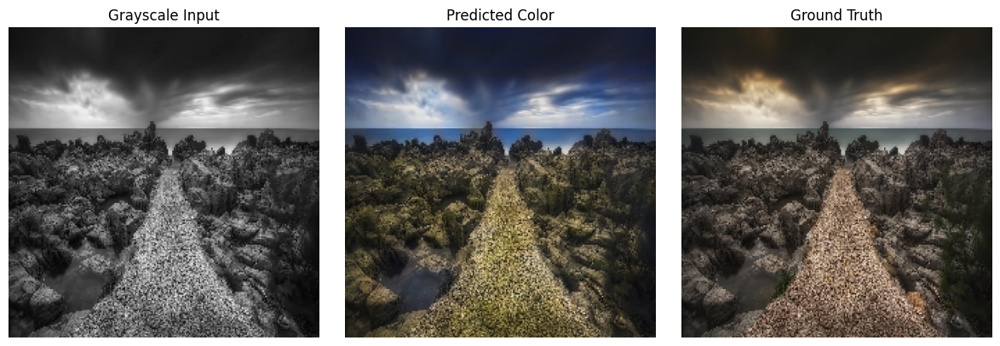

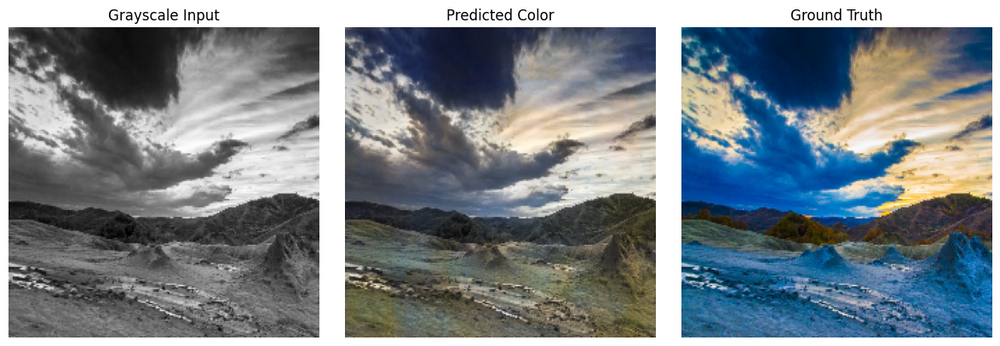

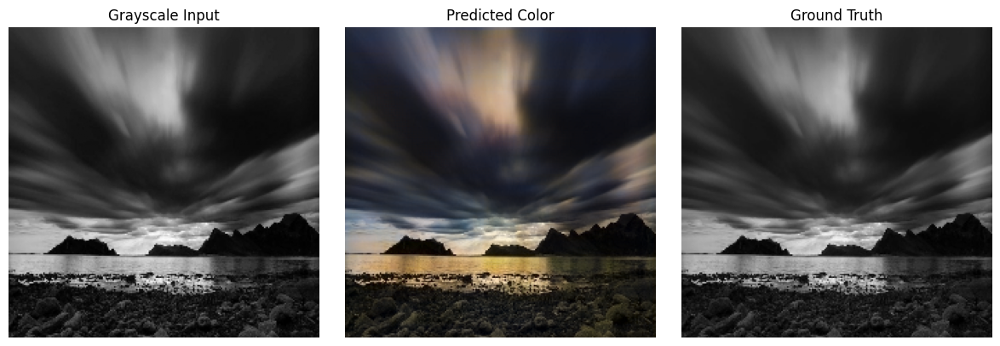

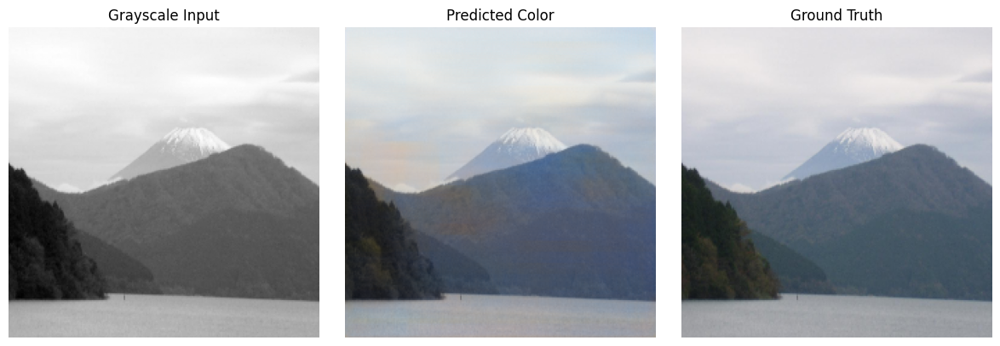

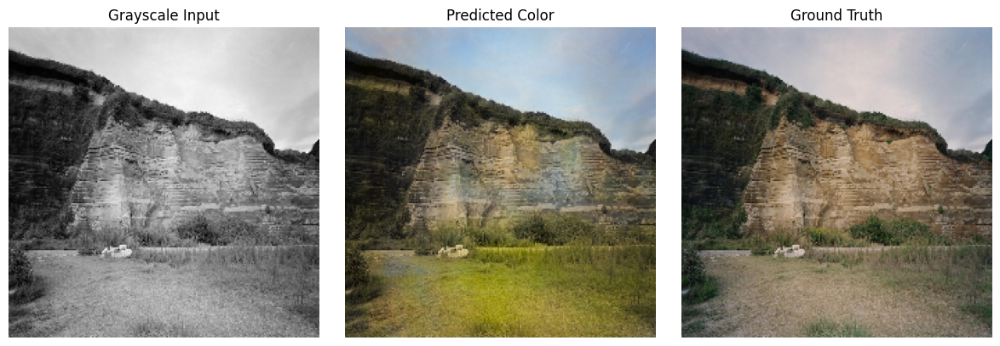

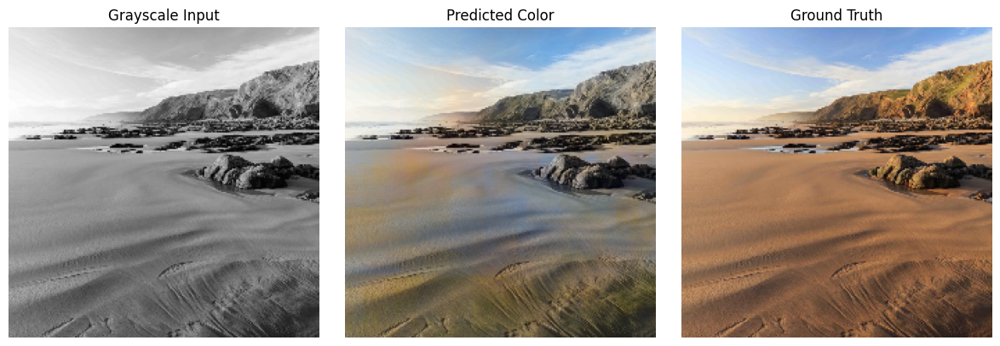

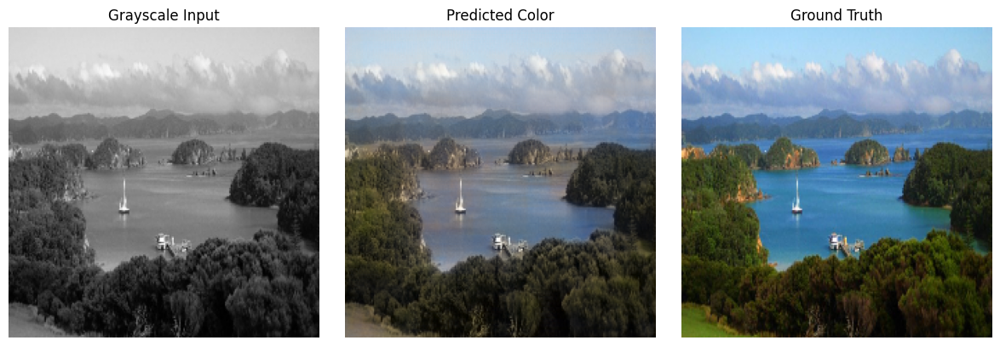

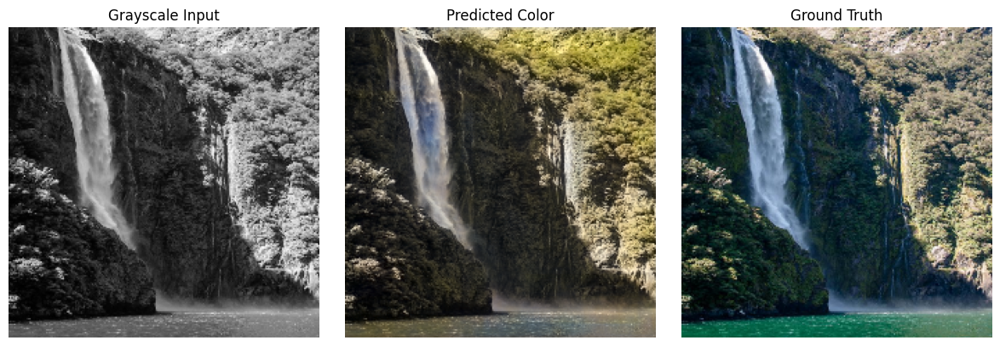

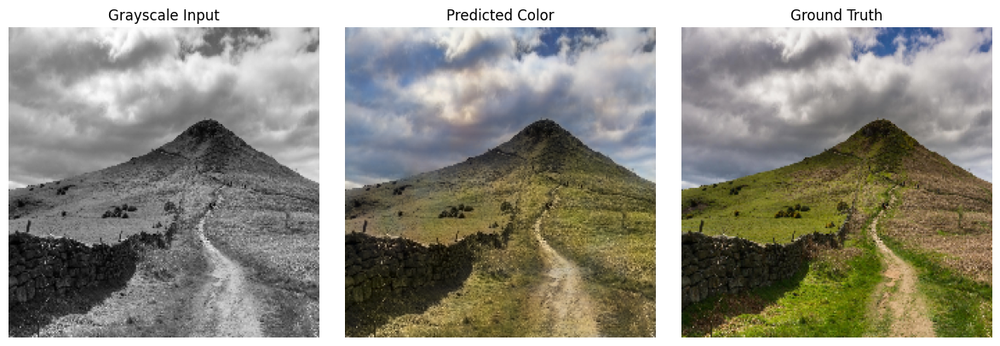

In [69]:
for i in range(10):
  visualize_colorization(model, test_dataset, i)

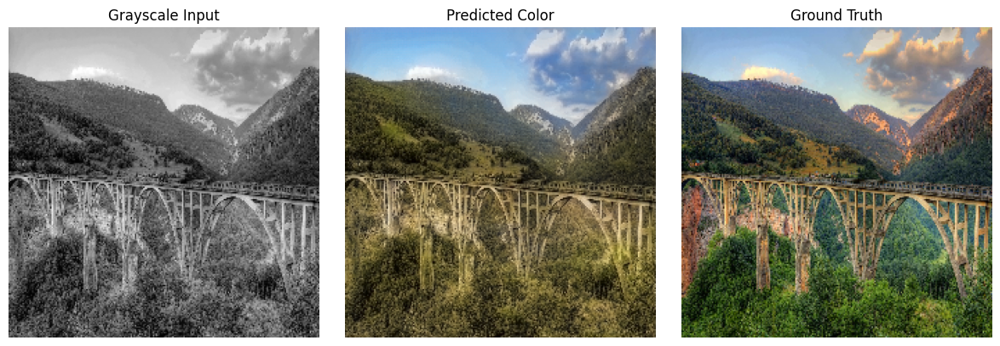

In [89]:
visualize_colorization(model, test_dataset, 76)

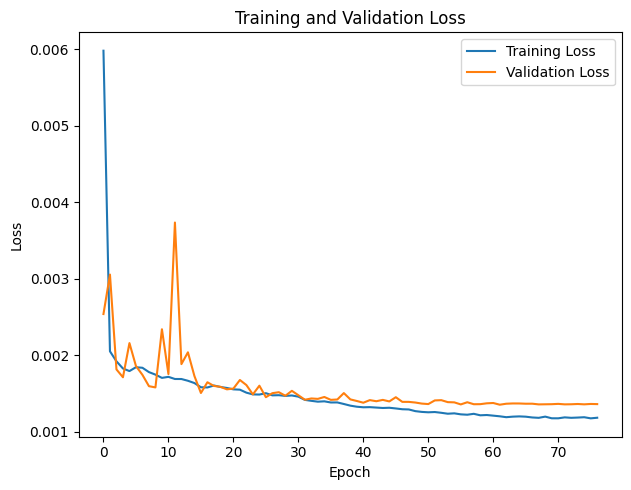

Training history plot saved to: drive/MyDrive/unet_colorization/training_history.png


<Figure size 640x480 with 0 Axes>

In [53]:
import matplotlib.pyplot as plt
import os

# Plot training and validation loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Save the figure to Google Drive
plot_save_path = os.path.join(DRIVE_DIR, 'training_history.png')
plt.savefig(plot_save_path)
print(f"Training history plot saved to: {plot_save_path}")

In [54]:
mean_mae, mean_psnr, mean_ssim = evaluate_model(model, val_dataset)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step

/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 3 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 27 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 2 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 40 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 6 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 7 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
Evaluation Metrics on Dataset:
MAE (ab channels): 0.0358
PSNR (RGB): 22.64
SSIM (RGB): 0.9106


In [56]:
!pip install -q torch torchvision lpips


In [57]:
import torch
import lpips

# LPIPS model
lpips_fn = lpips.LPIPS(net='alex')
lpips_fn.eval()

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth


LPIPS(
  (scaling_layer): ScalingLayer()
  (net): alexnet(
    (slice1): Sequential(
      (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
      (1): ReLU(inplace=True)
    )
    (slice2): Sequential(
      (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (4): ReLU(inplace=True)
    )
    (slice3): Sequential(
      (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (7): ReLU(inplace=True)
    )
    (slice4): Sequential(
      (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): ReLU(inplace=True)
    )
    (slice5): Sequential(
      (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
    )
  )
  (lin0): NetLinLayer(
    (model): Sequential(
      (0): D

In [58]:
from skimage.color import deltaE_ciede2000

In [59]:
def rgb_to_lpips_tensor(rgb):
    """
    rgb: (H,W,3) in [0,1]
    """
    tensor = torch.from_numpy(rgb).permute(2, 0, 1).unsqueeze(0).float()
    tensor = tensor * 2.0 - 1.0  # [0,1] -> [-1,1]
    return tensor

In [60]:


def evaluate_model_with_lpips_deltaE(model, dataset):
    mae_list = []
    psnr_list = []
    ssim_list = []
    lpips_list = []
    deltae_list = []

    for L_batch, ab_batch in dataset:
        L_batch = L_batch.numpy()
        ab_batch = ab_batch.numpy()

        pred_ab_batch = model.predict(L_batch, verbose=0)

        mae_list.append(np.mean(np.abs(pred_ab_batch - ab_batch)))

        for i in range(L_batch.shape[0]):
            L = L_batch[i]
            true_ab = ab_batch[i]
            pred_ab = pred_ab_batch[i]

            # Reconstruct RGB
            true_rgb = reconstruct_rgb(L, true_ab)
            pred_rgb = reconstruct_rgb(L, pred_ab)

            # PSNR
            from skimage.metrics import peak_signal_noise_ratio as psnr
            psnr_list.append(psnr(true_rgb, pred_rgb, data_range=1.0))

            # SSIM
            from skimage.metrics import structural_similarity as ssim
            ssim_list.append(ssim(true_rgb, pred_rgb,
                                   data_range=1.0,
                                   channel_axis=-1,
                                   win_size=7))

            # LPIPS
            with torch.no_grad():
                lpips_val = lpips_fn(
                    rgb_to_lpips_tensor(true_rgb),
                    rgb_to_lpips_tensor(pred_rgb)
                )
            lpips_list.append(lpips_val.item())

            # Delta E
            from skimage.color import rgb2lab
            true_lab = rgb2lab(np.clip(true_rgb, 0, 1))
            pred_lab = rgb2lab(np.clip(pred_rgb, 0, 1))
            deltae_list.append(np.mean(deltaE_ciede2000(true_lab, pred_lab)))

    print("📊 Test Dataset Metrics")
    print(f"MAE (ab):   {np.mean(mae_list):.4f}")
    print(f"PSNR (RGB): {np.mean(psnr_list):.2f}")
    print(f"SSIM (RGB): {np.mean(ssim_list):.4f}")
    print(f"LPIPS ↓:    {np.mean(lpips_list):.4f}")
    print(f"ΔE ↓:       {np.mean(deltae_list):.2f}")

    return {
        "MAE": np.mean(mae_list),
        "PSNR": np.mean(psnr_list),
        "SSIM": np.mean(ssim_list),
        "LPIPS": np.mean(lpips_list),
        "DeltaE": np.mean(deltae_list)
    }

In [90]:
test_metrics = evaluate_model_with_lpips_deltaE(model, val_dataset)

/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 6 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)
/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 40 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)
/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 27 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)
/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)
/tmp/ipython-input-1441184516.py:15: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 2 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab_img)
/tmp/ipython-input-1441184516.py:15: UserWa

📊 Test Dataset Metrics
MAE (ab):   0.0358
PSNR (RGB): 22.64
SSIM (RGB): 0.9106
LPIPS ↓:    0.1781
ΔE ↓:       10.10
